In [1]:
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import ascii, fits
from matplotlib.gridspec import GridSpec
from scipy import interpolate
import pandas as pd
from scipy.stats import median_abs_deviation
from scipy.optimize import curve_fit
%matplotlib inline

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

import seaborn as sns
mymap2 = sns.color_palette("icefire", as_cmap=True)

In [2]:
# path to the directory containing the combined rectified and cal files
path = '/Users/jpw/Analysis/NIRSPEC/iSHELL/240106/'
source = 'HLTau_PA138'
wavecal = 'wavecal160-169.fits'

path = '/Users/jpw/Analysis/NIRSPEC/iSHELL/240107/'
source = 'CWTau_PA61'
wavecal = 'wavecal97-128.fits'

order = 106

In [3]:
suborder_factor=10
print(f'Window width = {int(1996/suborder_factor)} pixels')
nfwhm=3

Window width = 199 pixels


In [4]:
# load atmospheric transmission file
hdu = fits.open('/Users/jpw/idl/Spextool/data/atran75000.fits')
tdata = hdu[0].data
atrans = interpolate.interp1d(tdata[0,:], tdata[1,:])
hdu.close()

In [5]:
j1 = 30           # starting point of first order -- figured out by hand
dj_AB = 121       # width of each order -- this should match the size of the number of rows in the order extension
dj_blank = 30     # gap between orders -- this is figured out by eye and assumed to be the same for all orders

In [6]:
hdu = fits.open(path+f'rectified/{source}_rectified.fits')
flux = hdu[0].data
var = hdu[1].data

In [7]:
hdu2 = fits.open(path+f'cal/{wavecal}')
wc_hd = hdu2[0].header
orders = wc_hd['ORDERS'].split(',')
wavecal = hdu2[10].data
wl = wavecal[0, 0, :]

In [8]:
#for n, order_i in enumerate(orders[::-1]):
#    norder = len(orders) - n - 1
#    print(f'Order: {order_i}  -->  Wavecal index: {3+norder}  -->  wavecal = hdu2[{3+norder}].data')

In [9]:
j0 = j1 + (dj_AB + dj_blank) * (order - 99)
nx = flux.shape[1]

order_flux = flux[j0:j0+dj_AB, :]
order_var = var[j0:j0+dj_AB, :]

Text(0.5, 1.0, 'Order 106')

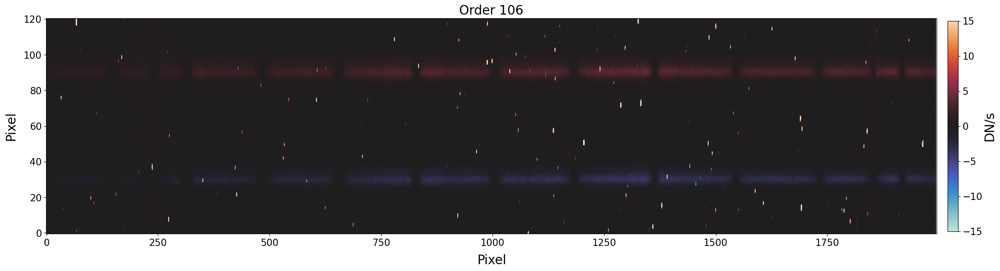

In [10]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(order_flux, origin='lower', vmin=-15, vmax=15, aspect=4, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

Text(0.5, 1.0, 'Order 106')

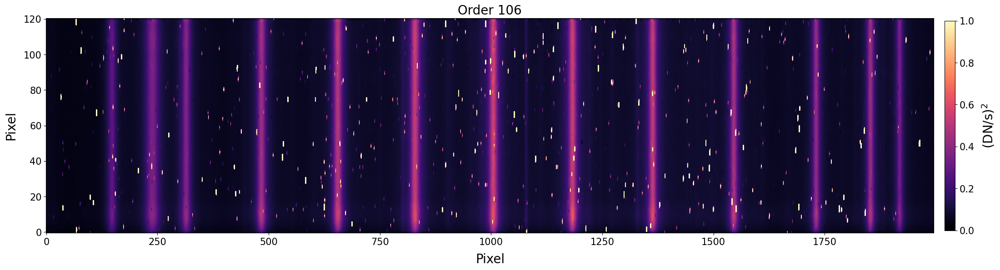

In [11]:
order_var = var[j0:j0+dj_AB, :]

fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_var), origin='lower', vmin=0, vmax=1, aspect=4, cmap='magma')
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label(r'(DN/s)$^2$', fontsize = 20, labelpad=10)
ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

In [12]:
def remove_hot_pixels(order_flux, order_var, MAD_factor=20):
    # creating a mask on the variance image, putting to False all pixels that for each column are outside 5 sigma
    mask_var = np.full(order_var.shape, True)
    for i in range(order_var.shape[1]):
        column = np.nan_to_num(order_var[:,i])   # I retain nan_to_num because median_abs_deviation cannot work with NaNs
        median = np.nanmedian(column)
        #sigma = np.std(column)
        MAD = median_abs_deviation(column)    # Median Absolutet Deviation, much better than standard deviation since it's not influenced by outliers
        mask_column = np.logical_and(column>0, column<median+MAD_factor*MAD)    # 20 seems like a not too aggressive value
        mask_var[:,i] = mask_column

    # converting the mask from boolean to 0 and 1
    mask_var = np.array(mask_var, dtype=int)
    # convert zeros to NaNs
    mask_var = mask_var.astype(float)
    mask_var[mask_var==0] = np.nan
    
    order_flux_masked = order_flux*mask_var
    order_var_masked = order_var*mask_var
    
    return order_flux_masked, order_var_masked

In [13]:
order_flux_masked, order_var_masked = remove_hot_pixels(order_flux, order_var, MAD_factor=20)

Text(0.5, 1.0, 'Order 106')

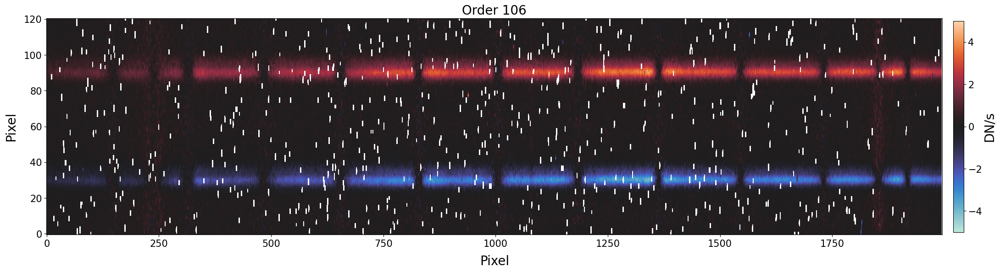

In [15]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(order_flux_masked, origin='lower', vmin=-5, vmax=5, aspect=4, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

Text(0.5, 1.0, 'Order 106')

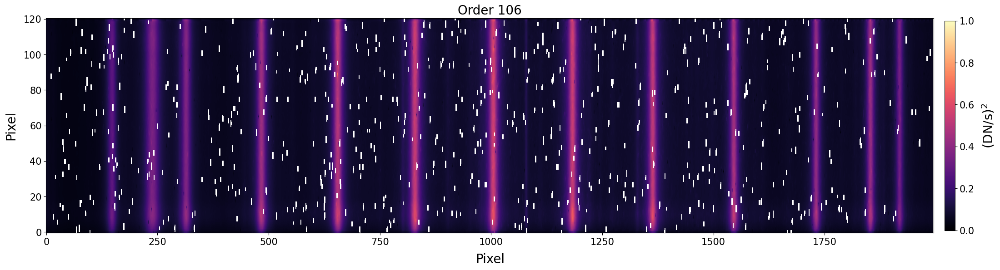

In [16]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(order_var_masked, origin='lower', vmin=0, vmax=1, aspect=4, cmap='magma')
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label(r'(DN/s)$^2$', fontsize = 20, labelpad=10)
ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

Text(0.5, 1.0, 'Order 106')

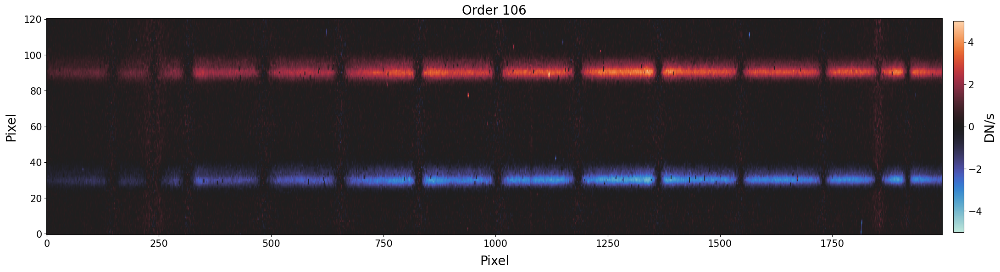

In [18]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_flux_masked), origin='lower', vmin=-5, vmax=5, aspect=4, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

Text(0.5, 1.0, 'Order 106')

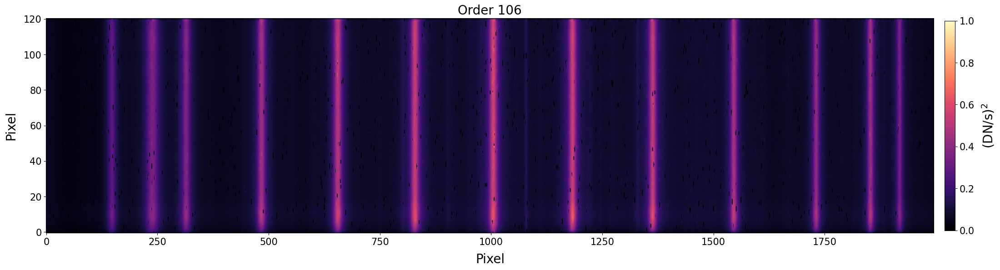

In [19]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_var_masked), origin='lower', vmin=0, vmax=1, aspect=4, cmap='magma')
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label(r'(DN/s)$^2$', fontsize = 20, labelpad=10)
ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

# SA

In [20]:
# two gaussians with different peaks and offsets but same FWHM
# added an extra constant offset since some orders are not perfectly sky-subtracted
def gauss2(x, A1, x1, A2, x2, fwhm, C):
    sigma = fwhm / np.sqrt(8*np.log(2))
    y = A1 * np.exp(-0.5*((x-x1)/sigma)**2) + A2 * np.exp(-0.5*((x-x2)/sigma)**2) + C
    return y

In [21]:
def fit_median(order_flux, pix_nofit=0, plotfile=None):
    # stack an order in wavelength to measure the average slit profile and guide individual fits
    im_median = np.nanmedian(order_flux, axis=1)
    j = np.arange(im_median.size)
    p0 = [np.min(im_median), np.argmin(im_median), np.max(im_median), np.argmax(im_median), 2, 0]

    # don't fit within s_nofit of the edges
    fit_range = (j > pix_nofit) & (j < j[-1]-pix_nofit)

    # fit two gaussians to the data
    pfit, pcov = curve_fit(gauss2, j[fit_range], im_median[fit_range], p0)
    perr = np.sqrt(np.diag(pcov))

    if plotfile is not None:
        fig, ax = plt.subplots(figsize=(8, 4))
        ax.step(j, im_median)
        ax.plot(j[fit_range], gauss2(j[fit_range], *pfit))
        ax.set_xlabel(r"Row (pixels)", fontsize=14)
        ax.set_ylabel(r"Flux (Jy)", fontsize=14)
        fig.tight_layout()
        fig.savefig(plotfile, dpi=300)

    return pfit, perr

In [22]:
ny, nx = order_flux_masked.shape
pfit, perr = fit_median(order_flux, pix_nofit=0)#, plotfile=path+source+'_fit_median.png')
order_std = np.sqrt(order_var)

jneg =  pfit[1] + np.array([0, -0.5*nfwhm, 0.5*nfwhm]) * pfit[4]
jpos =  pfit[3] + np.array([0, -0.5*nfwhm, 0.5*nfwhm]) * pfit[4]

Text(0.5, 1.0, 'Order 106')

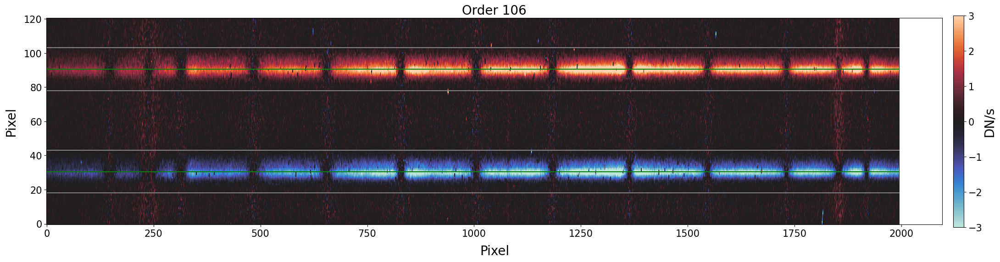

In [24]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_flux_masked), origin='lower', vmin=-3, vmax=3, aspect=4, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.hlines([jneg[0], jpos[0]], 0, nx, color='g')
ax.hlines([jneg[1], jneg[2], jpos[1], jpos[2]], 0, nx, color='gray')

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

Text(0.5, 1.0, 'Order 106')

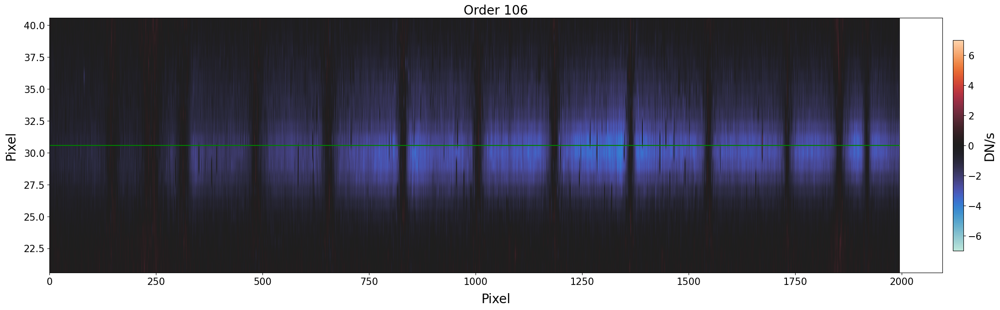

In [25]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_flux_masked), origin='lower', vmin=-7, vmax=7, aspect=30, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.hlines([jneg[0], jpos[0]], 0, nx, color='g')
ax.hlines([jneg[1], jneg[2], jpos[1], jpos[2]], 0, nx, color='gray')

ylim=10
ax.set_ylim(jneg[0]-ylim, jneg[0]+ylim)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

In [26]:
y_wmean_neg = np.zeros(nx)
y_wmean_neg_err = np.zeros(nx)

for i in range(nx):
    flux_slice_neg = order_flux_masked[int(np.around(jneg[1])): int(np.around(jneg[2]))+1, i]
    std_slice_neg = order_var_masked[int(np.around(jneg[1])): int(np.around(jneg[2]))+1, i]
    yarr_neg = np.arange(int(np.around(jneg[1])), int(np.around(jneg[2]))+1)
    
    # calculating vertical position mean for each column weighted by the flux for the negative copy
    num = np.nansum(yarr_neg*flux_slice_neg)
    den = np.nansum(flux_slice_neg)
    y_wmean_neg[i] = num / den
    
    # Error
    der = (yarr_neg*den-num)/den**2
    y_wmean_neg_err[i] = np.nansum(np.abs(der)*std_slice_neg)*1/np.sqrt(yarr_neg.size)

#print(y_wmean_neg_err)

/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/150032075.py:12: RuntimeWarning: invalid value encountered in double_scalars
  y_wmean_neg[i] = num / den
/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/150032075.py:15: RuntimeWarning: invalid value encountered in divide
  der = (yarr_neg*den-num)/den**2


Text(0.5, 1.0, 'Order 106')

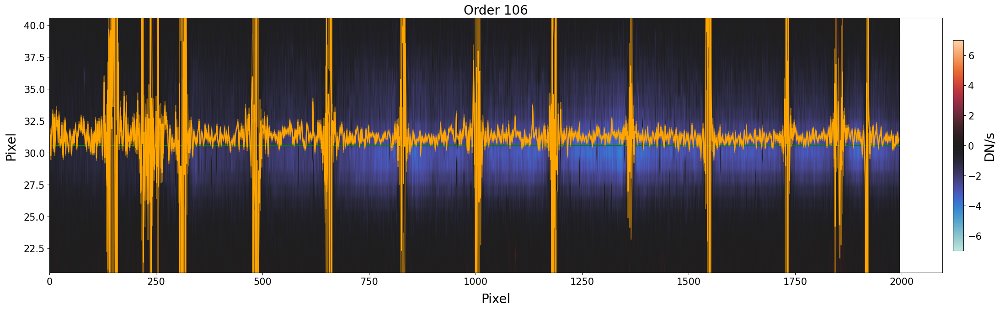

In [27]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_flux_masked), origin='lower', vmin=-7, vmax=7, aspect=30, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.hlines([jneg[0], jpos[0]], 0, nx, color='g')
ax.hlines([jneg[1], jneg[2], jpos[1], jpos[2]], 0, nx, color='gray')

ax.plot(np.arange(nx), y_wmean_neg, color='orange')
ax.plot(np.arange(nx), y_wmean_neg-y_wmean_neg_err,y_wmean_neg+y_wmean_neg_err, color='orange', alpha=0.5)

ylim=10
ax.set_ylim(jneg[0]-ylim, jneg[0]+ylim)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

In [28]:
y_wmean_neg = np.zeros(nx)
y_wmean_neg_err = np.zeros(nx)

y_wmean_window_neg = np.zeros(nx)
y_wmean_window_neg_err = np.zeros(nx)

for i in range(nx):
    flux_slice_neg = order_flux_masked[int(np.around(jneg[1])): int(np.around(jneg[2]))+1, i]
    std_slice_neg = order_var_masked[int(np.around(jneg[1])): int(np.around(jneg[2]))+1, i]
    yarr_neg = np.arange(int(np.around(jneg[1])), int(np.around(jneg[2]))+1)
    
    # calculating vertical position mean for each column weighted by the flux for the negative copy
    num = np.nansum(yarr_neg*flux_slice_neg)
    den = np.nansum(flux_slice_neg)
    y_wmean_neg[i] = num / den
    
    # Error
    der = (yarr_neg*den-num)/den**2
    y_wmean_neg_err[i] = np.nansum(np.abs(der)*std_slice_neg)*1/np.sqrt(yarr_neg.size)
    
    ####### Moving median #######
    
    # Defining the width of the window for the moving median (must be an odd number)
    window_width = int(nx / suborder_factor)    
    if np.mod(window_width, 2) ==0:
        window_width+=1
        
    # Left edge
    if i<int((window_width-1)/2):
        suborder_flux = order_flux_masked[:, :i+1+int((window_width-1)/2)] 
    # Central pixels
    if int((window_width-1)/2)<= i < int(nx - (window_width-1)/2):
        suborder_flux = order_flux_masked[:,i-int((window_width-1)/2):i+1+int((window_width-1)/2)]
    # Right edge
    if i>=int(nx - (window_width-1)/2):
        suborder_flux = order_flux_masked[:, i-int((window_width-1)/2):] 
        
    flux_median = np.nanmedian(suborder_flux, axis=1)
        
    # Calculating vertical position mean weighted by the flux for the median within a window  
    flux_median_slice_neg = flux_median[int(np.around(jneg[1])): int(np.around(jneg[2]))+1]
    num = np.nansum(yarr_neg*flux_median_slice_neg)
    den = np.nansum(flux_median_slice_neg)
    y_wmean_window_neg[i] =  num / den
    
    # Error
    der = (yarr_neg*den-num)/den**2
    err_median = 1.253 *  np.nanstd(suborder_flux[int(np.around(jneg[1])): int(np.around(jneg[2]))+1], axis=1)  * 1/np.sqrt(suborder_flux.shape[1])   # standard error of the median
    y_wmean_window_neg_err[i] = np.nansum(np.abs(der)*err_median)*1/np.sqrt(yarr_neg.size)

/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/2622124453.py:15: RuntimeWarning: invalid value encountered in double_scalars
  y_wmean_neg[i] = num / den
/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/2622124453.py:18: RuntimeWarning: invalid value encountered in divide
  der = (yarr_neg*den-num)/den**2


Text(0.5, 1.0, 'Order 106')

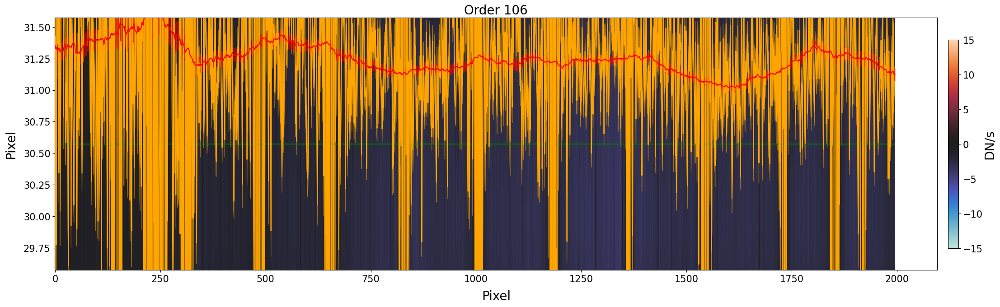

In [29]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_flux_masked), origin='lower', vmin=-15, vmax=15, aspect=300, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.hlines([jneg[0], jpos[0]], 0, nx, color='g')
ax.hlines([jneg[1], jneg[2], jpos[1], jpos[2]], 0, nx, color='gray')

ax.plot(np.arange(nx), y_wmean_neg, color='orange')
ax.fill_between(np.arange(nx), y_wmean_neg-y_wmean_neg_err,y_wmean_neg+y_wmean_neg_err, color='orange', alpha=0.5)

ax.plot(np.arange(nx), y_wmean_window_neg, color='red')
ax.fill_between(np.arange(nx), y_wmean_window_neg-y_wmean_window_neg_err,y_wmean_window_neg+y_wmean_window_neg_err, color='red', alpha=0.5)

ylim=1
ax.set_ylim(jneg[0]-ylim, jneg[0]+ylim)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

In [30]:
y_wmean_pos = np.zeros(nx)
y_wmean_pos_err = np.zeros(nx)

y_wmean_window_pos = np.zeros(nx)
y_wmean_window_pos_err = np.zeros(nx)

for i in range(nx):
    flux_slice_pos = order_flux_masked[int(np.around(jpos[1])): int(np.around(jpos[2]))+1, i]
    std_slice_pos = order_var_masked[int(np.around(jpos[1])): int(np.around(jpos[2]))+1, i]
    yarr_pos = np.arange(int(np.around(jpos[1])), int(np.around(jpos[2]))+1)
    
    # calculating vertical position mean for each column weighted by the flux for the posative copy
    num = np.nansum(yarr_pos*flux_slice_pos)
    den = np.nansum(flux_slice_pos)
    y_wmean_pos[i] = num / den
    
    # Error
    der = (yarr_pos*den-num)/den**2
    y_wmean_pos_err[i] = np.nansum(np.abs(der)*std_slice_pos)*1/np.sqrt(yarr_pos.size)
    
    ####### Moving median #######
    
    # Defining the width of the window for the moving median (must be an odd number)
    window_width = int(nx / suborder_factor)    
    if np.mod(window_width, 2) ==0:
        window_width+=1
        
    # Left edge
    if i<int((window_width-1)/2):
        suborder_flux = order_flux_masked[:, :i+1+int((window_width-1)/2)] 
    # Central pixels
    if int((window_width-1)/2)<= i < int(nx - (window_width-1)/2):
        suborder_flux = order_flux_masked[:,i-int((window_width-1)/2):i+1+int((window_width-1)/2)]
    # Right edge
    if i>=int(nx - (window_width-1)/2):
        suborder_flux = order_flux_masked[:, i-int((window_width-1)/2):] 
        
    flux_median = np.nanmedian(suborder_flux, axis=1)
        
    # Calculating vertical position mean weighted by the flux for the median within a window  
    flux_median_slice_pos = flux_median[int(np.around(jpos[1])): int(np.around(jpos[2]))+1]
    num = np.nansum(yarr_pos*flux_median_slice_pos)
    den = np.nansum(flux_median_slice_pos)
    y_wmean_window_pos[i] =  num / den
    
    # Error
    der = (yarr_pos*den-num)/den**2
    err_median = 1.253 *  np.nanstd(suborder_flux[int(np.around(jpos[1])): int(np.around(jpos[2]))+1], axis=1)  * 1/np.sqrt(suborder_flux.shape[1])   # standard error of the median
    y_wmean_window_pos_err[i] = np.nansum(np.abs(der)*err_median)*1/np.sqrt(yarr_pos.size)

/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/3742373620.py:15: RuntimeWarning: invalid value encountered in double_scalars
  y_wmean_pos[i] = num / den
/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/3742373620.py:18: RuntimeWarning: invalid value encountered in divide
  der = (yarr_pos*den-num)/den**2


Text(0.5, 1.0, 'Order 106')

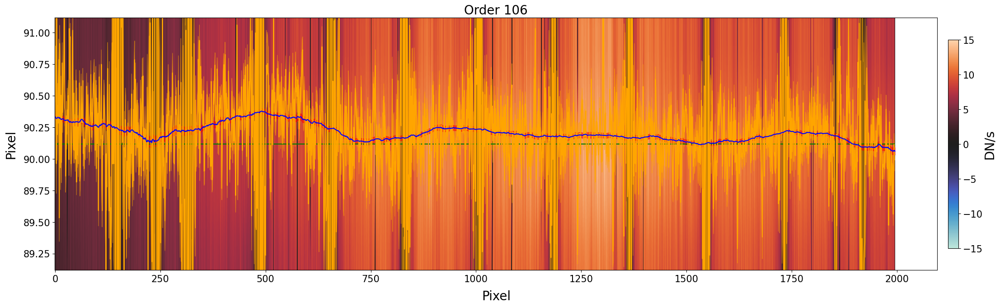

In [30]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_flux_masked), origin='lower', vmin=-15, vmax=15, aspect=300, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.hlines([jpos[0], jpos[0]], 0, nx, color='g')
ax.hlines([jpos[1], jpos[2], jpos[1], jpos[2]], 0, nx, color='gray')

ax.plot(np.arange(nx), y_wmean_pos, color='orange')
ax.fill_between(np.arange(nx), y_wmean_pos-y_wmean_pos_err,y_wmean_pos+y_wmean_pos_err, color='orange', alpha=0.5)

ax.plot(np.arange(nx), y_wmean_window_pos, color='b')
ax.fill_between(np.arange(nx), y_wmean_window_pos-y_wmean_window_pos_err,y_wmean_window_pos+y_wmean_window_pos_err, color='red', alpha=0.5)

ylim=1
ax.set_ylim(jpos[0]-ylim, jpos[0]+ylim)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

# Other order

In [31]:
order = 110
wavecal = hdu2[14].data
wl = wavecal[0, 0, :]

In [32]:
j0 = j1 + (dj_AB + dj_blank) * (order - 99)
nx = flux.shape[1]

order_flux = flux[j0:j0+dj_AB, :]
order_var = var[j0:j0+dj_AB, :]

order_flux_masked, order_var_masked = remove_hot_pixels(order_flux, order_var, MAD_factor=30)

Text(0.5, 1.0, 'Order 110')

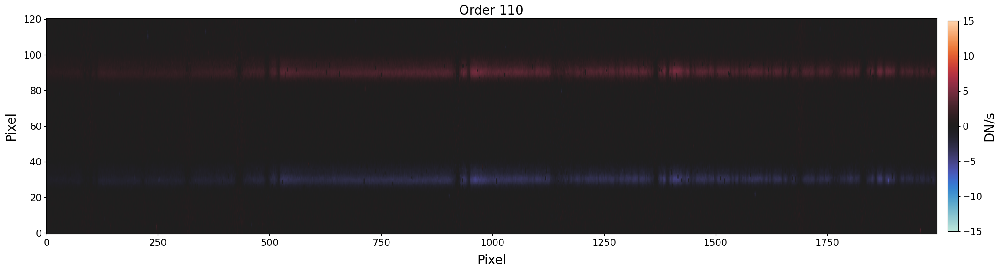

In [33]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_flux_masked), origin='lower', vmin=-15, vmax=15, aspect=4, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

Text(0.5, 1.0, 'Order 110')

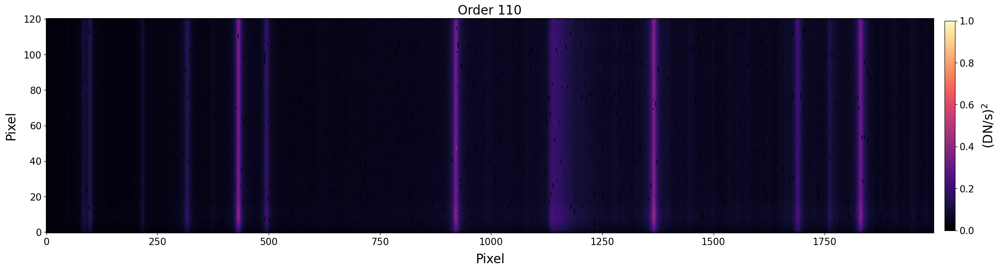

In [34]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_var_masked), origin='lower', vmin=0, vmax=1, aspect=4, cmap='magma')
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label(r'(DN/s)$^2$', fontsize = 20, labelpad=10)
ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

In [35]:
ny, nx = order_flux_masked.shape
pfit, perr = fit_median(order_flux, pix_nofit=0)#, plotfile=path+source+'_fit_median.png')
order_std = np.sqrt(order_var)

jneg =  pfit[1] + np.array([0, -0.5*nfwhm, 0.5*nfwhm]) * pfit[4]
jpos =  pfit[3] + np.array([0, -0.5*nfwhm, 0.5*nfwhm]) * pfit[4]

In [36]:
y_wmean_neg = np.zeros(nx)
y_wmean_neg_err = np.zeros(nx)

y_wmean_window_neg = np.zeros(nx)
y_wmean_window_neg_err = np.zeros(nx)

for i in range(nx):
    flux_slice_neg = order_flux_masked[int(np.around(jneg[1])): int(np.around(jneg[2]))+1, i]
    std_slice_neg = order_var_masked[int(np.around(jneg[1])): int(np.around(jneg[2]))+1, i]
    yarr_neg = np.arange(int(np.around(jneg[1])), int(np.around(jneg[2]))+1)
    
    # calculating vertical position mean for each column weighted by the flux for the negative copy
    num = np.nansum(yarr_neg*flux_slice_neg)
    den = np.nansum(flux_slice_neg)
    y_wmean_neg[i] = num / den
    
    # Error
    der = (yarr_neg*den-num)/den**2
    y_wmean_neg_err[i] = np.nansum(np.abs(der)*std_slice_neg)*1/np.sqrt(yarr_neg.size)
    
    ####### Moving median #######
    
    # Defining the width of the window for the moving median (must be an odd number)
    window_width = int(nx / suborder_factor)    
    if np.mod(window_width, 2) ==0:
        window_width+=1
        
    # Left edge
    if i<int((window_width-1)/2):
        suborder_flux = order_flux_masked[:, :i+1+int((window_width-1)/2)] 
    # Central pixels
    if int((window_width-1)/2)<= i < int(nx - (window_width-1)/2):
        suborder_flux = order_flux_masked[:,i-int((window_width-1)/2):i+1+int((window_width-1)/2)]
    # Right edge
    if i>=int(nx - (window_width-1)/2):
        suborder_flux = order_flux_masked[:, i-int((window_width-1)/2):] 
        
    flux_median = np.nanmedian(suborder_flux, axis=1)
        
    # Calculating vertical position mean weighted by the flux for the median within a window  
    flux_median_slice_neg = flux_median[int(np.around(jneg[1])): int(np.around(jneg[2]))+1]
    num = np.nansum(yarr_neg*flux_median_slice_neg)
    den = np.nansum(flux_median_slice_neg)
    y_wmean_window_neg[i] =  num / den
    
    # Error
    der = (yarr_neg*den-num)/den**2
    err_median = 1.253 *  np.nanstd(suborder_flux[int(np.around(jneg[1])): int(np.around(jneg[2]))+1], axis=1)  * 1/np.sqrt(suborder_flux.shape[1])   # standard error of the median
    y_wmean_window_neg_err[i] = np.nansum(np.abs(der)*err_median)*1/np.sqrt(yarr_neg.size)

/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/2622124453.py:15: RuntimeWarning: invalid value encountered in double_scalars
  y_wmean_neg[i] = num / den
/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/2622124453.py:18: RuntimeWarning: invalid value encountered in divide
  der = (yarr_neg*den-num)/den**2


Text(0.5, 1.0, 'Order 110')

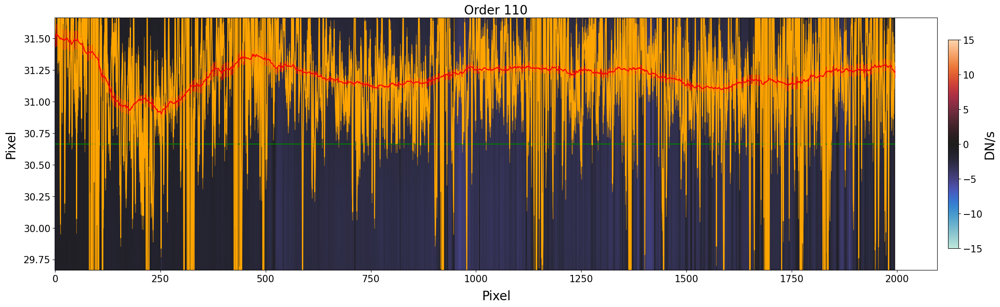

In [37]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_flux_masked), origin='lower', vmin=-15, vmax=15, aspect=300, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.hlines([jneg[0], jpos[0]], 0, nx, color='g')
ax.hlines([jneg[1], jneg[2], jpos[1], jpos[2]], 0, nx, color='gray')

ax.plot(np.arange(nx), y_wmean_neg, color='orange')
ax.fill_between(np.arange(nx), y_wmean_neg-y_wmean_neg_err,y_wmean_neg+y_wmean_neg_err, color='orange', alpha=0.5)

ax.plot(np.arange(nx), y_wmean_window_neg, color='red')
ax.fill_between(np.arange(nx), y_wmean_window_neg-y_wmean_window_neg_err,y_wmean_window_neg+y_wmean_window_neg_err, color='red', alpha=0.5)

ylim=1
ax.set_ylim(jneg[0]-ylim, jneg[0]+ylim)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)

In [38]:
y_wmean_pos = np.zeros(nx)
y_wmean_pos_err = np.zeros(nx)

y_wmean_window_pos = np.zeros(nx)
y_wmean_window_pos_err = np.zeros(nx)

for i in range(nx):
    flux_slice_pos = order_flux_masked[int(np.around(jpos[1])): int(np.around(jpos[2]))+1, i]
    std_slice_pos = order_var_masked[int(np.around(jpos[1])): int(np.around(jpos[2]))+1, i]
    yarr_pos = np.arange(int(np.around(jpos[1])), int(np.around(jpos[2]))+1)
    
    # calculating vertical position mean for each column weighted by the flux for the posative copy
    num = np.nansum(yarr_pos*flux_slice_pos)
    den = np.nansum(flux_slice_pos)
    y_wmean_pos[i] = num / den
    
    # Error
    der = (yarr_pos*den-num)/den**2
    y_wmean_pos_err[i] = np.nansum(np.abs(der)*std_slice_pos)*1/np.sqrt(yarr_pos.size)
    
    ####### Moving median #######
    
    # Defining the width of the window for the moving median (must be an odd number)
    window_width = int(nx / suborder_factor)    
    if np.mod(window_width, 2) ==0:
        window_width+=1
        
    # Left edge
    if i<int((window_width-1)/2):
        suborder_flux = order_flux_masked[:, :i+1+int((window_width-1)/2)] 
    # Central pixels
    if int((window_width-1)/2)<= i < int(nx - (window_width-1)/2):
        suborder_flux = order_flux_masked[:,i-int((window_width-1)/2):i+1+int((window_width-1)/2)]
    # Right edge
    if i>=int(nx - (window_width-1)/2):
        suborder_flux = order_flux_masked[:, i-int((window_width-1)/2):] 
        
    flux_median = np.nanmedian(suborder_flux, axis=1)
        
    # Calculating vertical position mean weighted by the flux for the median within a window  
    flux_median_slice_pos = flux_median[int(np.around(jpos[1])): int(np.around(jpos[2]))+1]
    num = np.nansum(yarr_pos*flux_median_slice_pos)
    den = np.nansum(flux_median_slice_pos)
    y_wmean_window_pos[i] =  num / den
    
    # Error
    der = (yarr_pos*den-num)/den**2
    err_median = 1.253 *  np.nanstd(suborder_flux[int(np.around(jpos[1])): int(np.around(jpos[2]))+1], axis=1)  * 1/np.sqrt(suborder_flux.shape[1])   # standard error of the median
    y_wmean_window_pos_err[i] = np.nansum(np.abs(der)*err_median)*1/np.sqrt(yarr_pos.size)

/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/3742373620.py:15: RuntimeWarning: invalid value encountered in double_scalars
  y_wmean_pos[i] = num / den
/var/folders/tx/plmj8k8969gcvbqj4tml5hvm0000gn/T/ipykernel_23162/3742373620.py:18: RuntimeWarning: invalid value encountered in divide
  der = (yarr_pos*den-num)/den**2


Text(0.5, 1.0, 'Order 110')

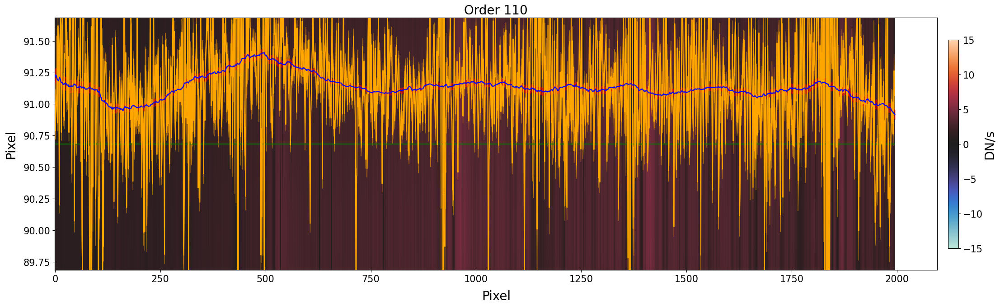

In [39]:
fig, ax = plt.subplots(figsize=(30, 10))
im = ax.imshow(np.nan_to_num(order_flux_masked), origin='lower', vmin=-15, vmax=15, aspect=300, cmap=mymap2)
cbar = fig.colorbar(im,  ax=ax, pad=0.01, shrink=0.6)
cbar.ax.tick_params(which='major', labelsize=15)
cbar.set_label('DN/s', fontsize = 20, labelpad=1)

ax.hlines([jpos[0], jpos[0]], 0, nx, color='g')
ax.hlines([jpos[1], jpos[2], jpos[1], jpos[2]], 0, nx, color='gray')

ax.plot(np.arange(nx), y_wmean_pos, color='orange')
ax.fill_between(np.arange(nx), y_wmean_pos-y_wmean_pos_err,y_wmean_pos+y_wmean_pos_err, color='orange', alpha=0.5)

ax.plot(np.arange(nx), y_wmean_window_pos, color='b')
ax.fill_between(np.arange(nx), y_wmean_window_pos-y_wmean_window_pos_err,y_wmean_window_pos+y_wmean_window_pos_err, color='red', alpha=0.5)

ylim=1
ax.set_ylim(jpos[0]-ylim, jpos[0]+ylim)

ax.tick_params(which='major',labelsize=15)
ax.set_xlabel('Pixel', fontsize = 20, labelpad=10)
ax.set_ylabel('Pixel', fontsize = 20, labelpad=10)
plt.title(f'Order {order}', fontsize=20)